In [1]:
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors
import time
import sys
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans
import seaborn as sns
import random

random.seed(10)


def get_windows(job,n_neighbors):
    '''
    For each region and each individual cell in dataset, return the indices of the nearest neighbors.
    
    'job:  meta data containing the start time,index of region, region name, indices of region in original dataframe
    n_neighbors:  the number of neighbors to find for each cell
    '''
    start_time,idx,tissue_name,indices = job
    job_start = time.time()
    
    print ("Starting:", str(idx+1)+'/'+str(len(exps)),': ' + exps[idx])

    tissue = tissue_group.get_group(tissue_name)
    to_fit = tissue.loc[indices][[X,Y]].values

#     fit = NearestNeighbors(n_neighbors=n_neighbors+1).fit(tissue[[X,Y]].values)
    fit = NearestNeighbors(n_neighbors=n_neighbors).fit(tissue[[X,Y]].values)
    m = fit.kneighbors(to_fit)
#     m = m[0][:,1:], m[1][:,1:]
    m = m[0], m[1]
    

    #sort_neighbors
    args = m[0].argsort(axis = 1)
    add = np.arange(m[1].shape[0])*m[1].shape[1]
    sorted_indices = m[1].flatten()[args+add[:,None]]

    neighbors = tissue.index.values[sorted_indices]
   
    end_time = time.time()
   
    print ("Finishing:", str(idx+1)+"/"+str(len(exps)),": "+ exps[idx],end_time-job_start,end_time-start_time)
    return neighbors.astype(np.int32)

In [2]:
ks = [5,10,20] # k=5 means it collects 5 nearest neighbors for each center cell
path_to_data = 'csv.csv' #CA the name does not matter here other than .csv extention, we will read and combine data in the cell below
X = 'X:X'
Y = 'Y:Y'
reg = 'File Name'
file_type = 'csv'

cluster_col = 'ClusterName'
keep_cols = [X,Y,reg,cluster_col]
save_path = ''

In [3]:
#read in data and do some quick data rearrangement
n_neighbors = max(ks)
assert (file_type=='csv' or file_type =='pickle') #


if file_type == 'pickle':
    cells = pd.read_pickle(path_to_data)
if file_type == 'csv':
    #CA read data to be combined
    cells1 = pd.read_csv('G3-PCa_dfmerged_Nolan-names_0904.csv')
    cells1_99 = cells1.sample(frac=0.99)
    cells2 = pd.read_csv('G4-PCa_dfmerged_Nolan-names_0904.csv')
    cells2_99 = cells2.sample(frac=0.99)
    cells3 = pd.read_csv('TAN-PCa_dfmerged_Nolan-names_0904.csv')
    cells3_99 = cells3.sample(frac=0.99)
    
    #CA combine all data read with the next to line
cells_3groups = [cells1_99, cells2_99, cells3_99]
cells_all = pd.concat(cells_3groups)

cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)

cells = cells.reset_index() #Uncomment this line if you do any subsetting of dataframe such as removing dirt etc or will throw error at end of next next code block (cell 6)

sum_cols = cells[cluster_col].unique()
values = cells[sum_cols].values
list(cells['patients'].unique())

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/1940152465.py:21: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)


[9, 12, 11, 13, 10, 4, 5, 7, 6, 8, 1, 2, 3]

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:23: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)


Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.43576788902282715 0.4369359016418457
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07516598701477051 0.5322649478912354
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.15531396865844727 0.6933410167694092
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.39133691787719727 1.0875530242919922
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.28968191146850586 1.3872430324554443
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.3033268451690674 1.6975669860839844
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3479940891265869 2.0509490966796875
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6056208610534668 2.662583827972412
Starting: 6/13 : 38592-6
Finishing: 6/13 : 38592-6 0.019832134246826172 2.6942713260650635
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05946993827819824 2.760136842727661
Starting: 10/13 : 54774-4
Finishing: 10/13 : 54774-4 0.3629751205444336 3.1239700317382812
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.5926728248596191 0.5945179462432861
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0877981185913086 0.7034611701965332
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.15774989128112793 0.8666508197784424
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.5450687408447266 1.4145448207855225
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.35040783882141113 1.7720439434051514
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.3224811553955078 2.1019279956817627
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.38370704650878906 2.4920198917388916
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.8088481426239014 3.3106279373168945
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.02730584144592285 3.353055000305176
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.08616089820861816 3.446413040161133
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.5010511875152588 3.948573350906372
Starting: 6

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4532129764556885 0.45390796661376953
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07273077964782715 0.5404098033905029
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.151597261428833 0.6967003345489502
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3806419372558594 1.0799579620361328
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2999610900878906 1.386286973953247
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.301055908203125 1.6938507556915283
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3131740093231201 2.0117931365966797
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5861408710479736 2.603286027908325
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.019256114959716797 2.6346590518951416
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.058760881423950195 2.6982409954071045
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3667161464691162 3.065558910369873
Starting: 8/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4403510093688965 0.4410591125488281
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.09565615653991699 0.5513091087341309
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.16776609420776367 0.7261712551116943
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.5273680686950684 1.2567200660705566
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.3146860599517822 1.5800838470458984
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.30600810050964355 1.8929839134216309
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.32404112815856934 2.222546100616455
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6306259632110596 2.8593740463256836
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.02123284339904785 2.8958687782287598
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.06276297569274902 2.96537184715271
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.5313100814819336 3.4979920387268066
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.47911691665649414 0.48047471046447754
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07149267196655273 0.5636289119720459
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.15022611618041992 0.7175981998443604
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.38360595703125 1.1036968231201172
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.29865026473999023 1.4085702896118164
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2991609573364258 1.7146189212799072
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3211090564727783 2.040778875350952
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6006250381469727 2.647172212600708
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.019618988037109375 2.6786539554595947
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.06003308296203613 2.743535041809082
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3535313606262207 3.0982091426849365
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4185750484466553 0.41929197311401367
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06715822219848633 0.49805498123168945
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1466658115386963 0.6484098434448242
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3741450309753418 1.0250349044799805
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.28349900245666504 1.3173837661743164
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.29113292694091797 1.614948034286499
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.31415700912475586 1.933809757232666
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5916280746459961 2.5306990146636963
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018456220626831055 2.5605032444000244
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05953407287597656 2.6246321201324463
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.37381505966186523 2.9990010261535645
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.47461986541748047 0.47532224655151367
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0718379020690918 0.5597097873687744
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.15493512153625488 0.7202661037445068
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.4116687774658203 1.1348438262939453
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.29663634300231934 1.4416303634643555
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.30033397674560547 1.748884916305542
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3167691230773926 2.0708839893341064
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.6139960289001465 2.690690040588379
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018532752990722656 2.7210538387298584
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.061823129653930664 2.787611961364746
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3488330841064453 3.137385845184326
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4359900951385498 0.4366757869720459
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.0711202621459961 0.5200722217559814
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1526811122894287 0.6777548789978027
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3983428478240967 1.0789902210235596
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2963111400604248 1.3857650756835938
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.3016026020050049 1.6942126750946045
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.317777156829834 2.0171308517456055
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5879049301147461 2.610834836959839
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.018413066864013672 2.6407721042633057
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05746102333068848 2.7030060291290283
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.33496785163879395 3.0387890338897705
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4243030548095703 0.42499303817749023
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06937694549560547 0.5058977603912354
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.15008282661437988 0.6600809097290039
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.37444400787353516 1.0371248722076416
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2809908390045166 1.324415922164917
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2959170341491699 1.626936912536621
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3097102642059326 1.9415900707244873
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.580456018447876 2.5275778770446777
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01973700523376465 2.5594260692596436
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.06153583526611328 2.626189947128296
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.349898099899292 2.9773640632629395
Starting: 6/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.45743417739868164 0.4581329822540283
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07271790504455566 0.5418660640716553
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1510159969329834 0.6970367431640625
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.38082194328308105 1.0803828239440918
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.28170013427734375 1.3711881637573242
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2904839515686035 1.6681840419769287
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.31311583518981934 1.9861021041870117
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.6064980030059814 2.5986030101776123
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.019257068634033203 2.6294479370117188
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.059854745864868164 2.6938889026641846
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.34614014625549316 3.040656089782715
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.43302488327026367 0.4337339401245117
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.07242918014526367 0.5202581882476807
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14932513236999512 0.6736209392547607
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.37578892707824707 1.052009105682373
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.28252196311950684 1.3408751487731934
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.28679513931274414 1.6342320442199707
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3038511276245117 1.9428269863128662
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5701470375061035 2.5184810161590576
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018022775650024414 2.5482537746429443
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05721592903137207 2.6101059913635254
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3454709053039551 2.956178903579712
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.43578171730041504 0.4365987777709961
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.0703420639038086 0.5195591449737549
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.14911603927612305 0.6726260185241699
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3720970153808594 1.0472979545593262
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2841801643371582 1.3407368659973145
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.285707950592041 1.6330111026763916
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.30905818939208984 1.9468610286712646
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5628690719604492 2.5152089595794678
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01815176010131836 2.544779062271118
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0566868782043457 2.605921745300293
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.34693288803100586 2.953429937362671
Starting: 10/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4227259159088135 0.4235532283782959
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07008171081542969 0.5047900676727295
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.1484360694885254 0.6573288440704346
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.38738393783569336 1.047165870666504
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2795729637145996 1.3358259201049805
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2880580425262451 1.630298137664795
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3045380115509033 1.9395561218261719
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5664262771606445 2.511322259902954
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017756223678588867 2.5405030250549316
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.06118917465209961 2.6061840057373047
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3413360118865967 2.9486820697784424
Starting: 7

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.4303317070007324 0.4310038089752197
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0705411434173584 0.5126380920410156
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14860916137695312 0.6653900146484375
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3682858943939209 1.036269187927246
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2825930118560791 1.325134038925171
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28673672676086426 1.6183898448944092
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.30334901809692383 1.9266290664672852
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5865621566772461 2.5196831226348877
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018214941024780273 2.5491318702697754
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.05705380439758301 2.6113169193267822
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.33466100692749023 2.946668863296509
Starting: 1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.41791367530822754 0.4185657501220703
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.07332229614257812 0.5037040710449219
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.14456510543823242 0.65212082862854
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3674921989440918 1.0223312377929688
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.27323174476623535 1.3016669750213623
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28220605850219727 1.5901880264282227
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.29992222785949707 1.8946962356567383
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5573790073394775 2.45833420753479
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01896190643310547 2.487928867340088
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05635690689086914 2.548872947692871
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.3408510684967041 2.8903160095214844
Starting: 6

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.43157291412353516 0.4323740005493164
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06882023811340332 0.5125651359558105
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.14844489097595215 0.6654577255249023
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3716108798980713 1.0395028591156006
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.27559804916381836 1.3242192268371582
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2860591411590576 1.616239309310913
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3071281909942627 1.92802095413208
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5688834190368652 2.502312421798706
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01865386962890625 2.532702922821045
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.057447195053100586 2.59497332572937
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.33834004402160645 2.933865785598755
Starting: 9/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.45717692375183105 0.4579148292541504
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.07171106338500977 0.5411889553070068
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1484971046447754 0.6936781406402588
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3763272762298584 1.0725622177124023
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2761499881744385 1.354928731918335
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28732895851135254 1.6486380100250244
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.30569005012512207 1.9593219757080078
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5706131458282471 2.535465955734253
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018431901931762695 2.5655338764190674
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05647706985473633 2.6265928745269775
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.34218907356262207 2.9694509506225586
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4253671169281006 0.4260380268096924
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06798624992370605 0.5042691230773926
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.14637398719787598 0.6546680927276611
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3695671558380127 1.0268771648406982
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.27574706077575684 1.3086621761322021
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2876622676849365 1.602776050567627
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3041250705718994 1.911510944366455
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5662879943847656 2.4830329418182373
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01850295066833496 2.513242721557617
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05614209175109863 2.5738980770111084
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3397538661956787 2.9147398471832275
Starting: 8

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.41689610481262207 0.4175570011138916
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06798505783081055 0.49697208404541016
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1450669765472412 0.6460130214691162
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.37261223793029785 1.0211820602416992
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2781102657318115 1.3081581592559814
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28678393363952637 1.6015570163726807
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.30538296699523926 1.9116520881652832
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5639379024505615 2.48105788230896
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01820206642150879 2.5106201171875
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05807018280029297 2.5731472969055176
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3437368869781494 2.9174728393554688
Starting: 10

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.41855406761169434 0.419219970703125
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06824898719787598 0.4984140396118164
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.14457011222839355 0.646914005279541
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.37268900871276855 1.022171974182129
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2736372947692871 1.3050062656402588
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.287276029586792 1.5987608432769775
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.30316901206970215 1.9065217971801758
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.5521481037139893 2.463999032974243
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018015146255493164 2.4931039810180664
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05719876289367676 2.554763078689575
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3468310832977295 2.9027419090270996
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.4247889518737793 0.425447940826416
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06682610511779785 0.50331711769104
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.14438676834106445 0.6513526439666748
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3808310031890869 1.0347468852996826
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2896919250488281 1.3303430080413818
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2925276756286621 1.6294138431549072
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.3076801300048828 1.9417998790740967
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5645849704742432 2.511664867401123
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018329858779907227 2.5410807132720947
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05585312843322754 2.6014668941497803
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.3460061550140381 2.9487791061401367
Starting: 6/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4178769588470459 0.4185307025909424
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06648802757263184 0.4965200424194336
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.14397192001342773 0.6442739963531494
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3664231300354004 1.013098955154419
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2751650810241699 1.2941861152648926
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.29618191719055176 1.5966870784759521
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.29669189453125 1.8980190753936768
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5683691501617432 2.4718501567840576
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01841115951538086 2.501027822494507
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.060797929763793945 2.5662548542022705
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3484947681427002 2.915332794189453
Starting: 9/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.4168996810913086 0.41771793365478516
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06709790229797363 0.49549102783203125
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.14209675788879395 0.6418497562408447
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3731112480163574 1.017301082611084
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2748148441314697 1.2979791164398193
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2832028865814209 1.5868239402770996
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3035249710083008 1.8946220874786377
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5587437152862549 2.458400011062622
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018130779266357422 2.4874837398529053
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05553007125854492 2.5474159717559814
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.33695507049560547 2.8849852085113525
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.4434700012207031 0.44426703453063965
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0716559886932373 0.5285599231719971
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.15322184562683105 0.6864409446716309
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.3921530246734619 1.0813651084899902
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.28809285163879395 1.3792657852172852
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2927370071411133 1.678412914276123
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3190920352935791 2.002408981323242
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5950448513031006 2.6029880046844482
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01940298080444336 2.6342999935150146
Starting: 1/13 : 48411-6
Finishing: 1/13 : 48411-6 0.059584617614746094 2.6985836029052734
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3581681251525879 3.058095932006836
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.46627116203308105 0.4670290946960449
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.10924696922302246 0.5885229110717773
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.20267128944396973 0.799342155456543
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3951277732849121 1.1972110271453857
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2862269878387451 1.489945888519287
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.30791807174682617 1.8044359683990479
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.31836915016174316 2.127721071243286
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.7569577693939209 2.8905320167541504
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.019974946975708008 2.923995018005371
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.06388401985168457 2.9939699172973633
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3676931858062744 3.362380027770996
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.44557785987854004 0.446256160736084
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07522892951965332 0.5334038734436035
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.14682793617248535 0.6846199035644531
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3932769298553467 1.0804059505462646
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.28326988220214844 1.3699710369110107
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.28922224044799805 1.6655240058898926
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3042571544647217 1.9751510620117188
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5739119052886963 2.5544111728668213
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018146038055419922 2.583425998687744
Starting: 1/13 : 48411-6
Finishing: 1/13 : 48411-6 0.05707883834838867 2.644925117492676
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.34169697761535645 2.9871809482574463
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.41984987258911133 0.42065882682800293
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06755304336547852 0.500359058380127
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.14502811431884766 0.6491250991821289
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3775770664215088 1.0291032791137695
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.29021692276000977 1.3285489082336426
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2853679656982422 1.620208978652954
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3056797981262207 1.9307489395141602
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.560955286026001 2.4971401691436768
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018168210983276367 2.526956081390381
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05720686912536621 2.588737964630127
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3374178409576416 2.927349805831909
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.42705798149108887 0.4277172088623047
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06940627098083496 0.5098018646240234
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.14652585983276367 0.6601948738098145
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.36959290504455566 1.0324170589447021
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2779839038848877 1.3192129135131836
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.285703182220459 1.6113190650939941
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.307478666305542 1.9234728813171387
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5666379928588867 2.4952991008758545
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018674135208129883 2.525073289871216
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.06078505516052246 2.5904691219329834
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.34686994552612305 2.937922954559326
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.4228847026824951 0.42354679107666016
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.07124018669128418 0.506335973739624
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.14528107643127441 0.6557250022888184
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.3730158805847168 1.0313720703125
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.28058886528015137 1.3182969093322754
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2848389148712158 1.6095688343048096
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.30554914474487305 1.9197351932525635
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.565291166305542 2.4904372692108154
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.0181272029876709 2.5201661586761475
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.06463193893432617 2.5893959999084473
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3431689739227295 2.9339420795440674
Starting: 7/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.41338586807250977 0.4140620231628418
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.0685892105102539 0.4948580265045166
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.16019201278686523 0.6588649749755859
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3758199214935303 1.0370407104492188
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.27588772773742676 1.321547031402588
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28640222549438477 1.6141529083251953
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.3101799488067627 1.9289779663085938
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6164736747741699 2.5507047176361084
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.019050121307373047 2.580706834793091
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05850100517272949 2.64426589012146
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3406860828399658 2.9856109619140625
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.41728782653808594 0.4181020259857178
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0667579174041748 0.49635982513427734
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.14253592491149902 0.6426820755004883
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.37698817253112793 1.022536039352417
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2753889560699463 1.3042030334472656
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28287792205810547 1.5933151245117188
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.3081798553466797 1.906162977218628
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.5805160999298096 2.4921610355377197
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.02010798454284668 2.5235238075256348
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.059239864349365234 2.5873570442199707
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3487579822540283 2.9373738765716553
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.42324018478393555 0.42389798164367676
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.0680692195892334 0.5009071826934814
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1456599235534668 0.6500658988952637
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3747079372406006 1.0271849632263184
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.27848196029663086 1.3148019313812256
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2843351364135742 1.6053102016448975
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.3031270503997803 1.9131217002868652
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5697579383850098 2.4884660243988037
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01807880401611328 2.5179169178009033
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.056554317474365234 2.5790200233459473
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3680851459503174 2.947772979736328
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.41582226753234863 0.41647839546203613
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0682060718536377 0.49634671211242676
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14527392387390137 0.6455049514770508
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3673419952392578 1.0153841972351074
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.27837610244750977 1.3024051189422607
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.287355899810791 1.5960056781768799
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.3026278018951416 1.9031548500061035
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5704240798950195 2.4788899421691895
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018173933029174805 2.5077099800109863
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05734705924987793 2.569441080093384
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3434789180755615 2.913482904434204
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.41672205924987793 0.41737985610961914
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06955695152282715 0.5010449886322021
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.14560198783874512 0.6504566669464111
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.37250709533691406 1.0254268646240234
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2765669822692871 1.3081409931182861
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.28979992866516113 1.604248046875
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3079500198364258 1.9167900085449219
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.567979097366333 2.4901671409606934
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.022237062454223633 2.523400068283081
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.058403968811035156 2.5873329639434814
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3421916961669922 2.930593967437744
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.418226957321167 0.41887593269348145
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.06778073310852051 0.4980177879333496
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.15134429931640625 0.6542820930480957
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.36783576011657715 1.0248749256134033
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.27671217918395996 1.3108153343200684
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.28725695610046387 1.6042530536651611
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3043222427368164 1.9136152267456055
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5681300163269043 2.487070322036743
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01829981803894043 2.517547845840454
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05588507652282715 2.5780529975891113
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3422508239746094 2.920893907546997
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.9585001468658447 0.9591672420501709
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07637310028076172 1.0486409664154053
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.15477204322814941 1.2090649604797363
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3713979721069336 1.5832788944244385
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2946619987487793 1.893435001373291
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2931668758392334 2.1930477619171143
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.32277607917785645 2.520400285720825
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6129040718078613 3.1384191513061523
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.02084493637084961 3.1716830730438232
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05900883674621582 3.235785961151123
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.36133623123168945 3.5983800888061523
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.42728710174560547 0.42798900604248047
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06703686714172363 0.5053770542144775
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14412999153137207 0.653008222579956
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.36803221702575684 1.0231990814208984
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2747480869293213 1.3037049770355225
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.291273832321167 1.601513147354126
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.30584287643432617 1.911642074584961
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5517828464508057 2.468423843383789
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01871514320373535 2.4980812072753906
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.05947113037109375 2.561889171600342
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.34493207931518555 2.907376766204834
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.4132568836212158 0.4140019416809082
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06833815574645996 0.49375009536743164
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.15270018577575684 0.6501979827880859
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3728911876678467 1.0256662368774414
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2737619876861572 1.3055779933929443
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2862510681152344 1.5982379913330078
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3009622097015381 1.9038050174713135
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5728459358215332 2.481890916824341
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.018252134323120117 2.510835886001587
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05713796615600586 2.572335958480835
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.33589911460876465 2.908796787261963
Starting: 10

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.42410802841186523 0.4247920513153076
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06712698936462402 0.5035881996154785
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1450200080871582 0.6529271602630615
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.37068700790405273 1.0261902809143066
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.27517008781433105 1.3103752136230469
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2849867343902588 1.6016428470611572
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2996351718902588 1.905947208404541
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5605721473693848 2.4717721939086914
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.018107175827026367 2.5008840560913086
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05913686752319336 2.5645768642425537
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.35649895668029785 2.921689748764038
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.43295884132385254 0.4336428642272949
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07113385200500488 0.5159809589385986
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14846515655517578 0.6683928966522217
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.37835693359375 1.0491671562194824
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2845313549041748 1.3399910926818848
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2887611389160156 1.635390043258667
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.30785107612609863 1.948019027709961
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.6205179691314697 2.5748400688171387
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018960952758789062 2.605681896209717
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05880093574523926 2.6690917015075684
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3551011085510254 3.0249061584472656
Starting: 7

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4456188678741455 0.4464240074157715
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07263994216918945 0.5315070152282715
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1518688201904297 0.6875779628753662
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.4402933120727539 1.1306180953979492
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2836568355560303 1.4241950511932373
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.29164695739746094 1.7234230041503906
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3137381076812744 2.041921854019165
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5833001136779785 2.63140869140625
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018707990646362305 2.661757230758667
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05879521369934082 2.725461006164551
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.34264492988586426 3.0693821907043457
Starting: 8/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.43491315841674805 0.43557000160217285
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07468795776367188 0.5216400623321533
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1558091640472412 0.6826891899108887
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.41498708724975586 1.1003320217132568
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2894570827484131 1.399090051651001
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.30948495864868164 1.7153871059417725
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3242051601409912 2.044512987136841
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5883150100708008 2.6388869285583496
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.019418954849243164 2.670163869857788
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.059602975845336914 2.73468017578125
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3580307960510254 3.0933761596679688
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.42292213439941406 0.42358827590942383
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.0682380199432373 0.5026130676269531
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1482250690460205 0.6550521850585938
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.4157900810241699 1.0735118389129639
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2904350757598877 1.3731861114501953
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.29731106758117676 1.676725149154663
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.32233500480651855 2.004220962524414
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.6676070690155029 2.67792010307312
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.020067691802978516 2.710852861404419
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.062001943588256836 2.778012990951538
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.37691402435302734 3.155622959136963
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.5063760280609131 0.5070741176605225
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07420611381530762 0.5932040214538574
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14893507957458496 0.7464570999145508
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.45639991760253906 1.2055320739746094
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.3462710380554199 1.5607340335845947
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.3343691825866699 1.9029991626739502
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3459818363189697 2.2546629905700684
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.8815622329711914 3.1419529914855957
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.02710890769958496 3.1869168281555176
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.06603598594665527 3.2600529193878174
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.4734351634979248 3.7352051734924316
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4461791515350342 0.44687533378601074
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07161712646484375 0.5307130813598633
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.15269684791564941 0.6875841617584229
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.39689016342163086 1.0872111320495605
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.29120588302612305 1.3878250122070312
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.29297685623168945 1.6883189678192139
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.32639002799987793 2.019495964050293
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5867941379547119 2.6117210388183594
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01979804039001465 2.643458127975464
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.0605320930480957 2.7091572284698486
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.36368584632873535 3.073472023010254
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.45522475242614746 0.45590782165527344
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.07181072235107422 0.540043830871582
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1490929126739502 0.6931970119476318
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3897531032562256 1.0854618549346924
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2886800765991211 1.3806331157684326
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.30336594581604004 1.6905040740966797
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3307793140411377 2.0262489318847656
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.6122052669525146 2.644145965576172
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.019507169723510742 2.675849199295044
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05952310562133789 2.7400920391082764
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.35689496994018555 3.0976572036743164
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.5076339244842529 0.5085129737854004
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06756210327148438 0.5874359607696533
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.15426397323608398 0.746086835861206
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.45925092697143555 1.2076659202575684
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.36994409561157227 1.588137149810791
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.30779218673706055 1.9030389785766602
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3140230178833008 2.2226030826568604
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.6192412376403809 2.8473289012908936
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018983125686645508 2.877673864364624
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.0600430965423584 2.9423141479492188
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.36430788040161133 3.307899236679077
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.45452308654785156 0.4552030563354492
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07109594345092773 0.5394518375396729
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.15277099609375 0.6969161033630371
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.4000687599182129 1.0996217727661133
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.29424619674682617 1.4010231494903564
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2988409996032715 1.706601858139038
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.32217907905578613 2.0342142581939697
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6756930351257324 2.7156598567962646
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.019441843032836914 2.747009038925171
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.06118893623352051 2.814023971557617
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.37150001525878906 3.1863739490509033
Starting: 10

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.4633808135986328 0.4641530513763428
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07135796546936035 0.5489411354064941
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1527550220489502 0.7067270278930664
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.4750840663909912 1.1848609447479248
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.31499505043029785 1.5081980228424072
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.29628682136535645 1.8113579750061035
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.32288217544555664 2.1392571926116943
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6030080318450928 2.747843027114868
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.02056121826171875 2.7810401916503906
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05946612358093262 2.8454363346099854
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3898637294769287 3.236556053161621
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.47340893745422363 0.47412896156311035
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07145404815673828 0.5562829971313477
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.14795207977294922 0.7078278064727783
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.40707898139953613 1.1169991493225098
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2852518558502197 1.411026954650879
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2973911762237549 1.7148489952087402
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.3157050609588623 2.0351221561431885
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5919077396392822 2.6325607299804688
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018592119216918945 2.662226915359497
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.057882070541381836 2.7246038913726807
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3482940196990967 3.073439121246338
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.41903209686279297 0.419694185256958
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06672000885009766 0.49837207794189453
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.14510583877563477 0.6474528312683105
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.38559794425964355 1.0360519886016846
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.27835583686828613 1.324042797088623
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2823619842529297 1.6128709316253662
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.29863500595092773 1.9162652492523193
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5813500881195068 2.502946138381958
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017979145050048828 2.5321459770202637
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.06934785842895508 2.6061339378356934
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3523111343383789 2.959090232849121
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.4152240753173828 0.4159369468688965
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06827282905578613 0.4961700439453125
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.14540696144104004 0.6458039283752441
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3676431179046631 1.0161590576171875
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2729179859161377 1.2952630519866943
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.28911614418029785 1.5907111167907715
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.30109429359436035 1.8967602252960205
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5694222450256348 2.4716312885284424
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018545866012573242 2.501116991043091
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.06200122833251953 2.5676400661468506
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3370697498321533 2.9058449268341064
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4280049800872803 0.4286689758300781
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06717681884765625 0.5075328350067139
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.1434800624847412 0.6549880504608154
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3670668601989746 1.024528980255127
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2787458896636963 1.3125319480895996
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2839968204498291 1.6029329299926758
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3004450798034668 1.908055067062378
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.565079927444458 2.4783668518066406
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018405914306640625 2.509406089782715
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.058798789978027344 2.572730779647827
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3374958038330078 2.9109838008880615
Starting: 6/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.4201829433441162 0.42084407806396484
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06875014305114746 0.5013821125030518
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.14516305923461914 0.6509509086608887
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3689608573913574 1.0227017402648926
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2802097797393799 1.3094418048858643
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.28421473503112793 1.6007277965545654
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3016777038574219 1.907266616821289
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5684299468994141 2.4810218811035156
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017846107482910156 2.510406017303467
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.056165218353271484 2.5712199211120605
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.34397101402282715 2.916419744491577
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.40766310691833496 0.4083139896392822
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06926369667053223 0.48892688751220703
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.15241408348083496 0.6453981399536133
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3628530502319336 1.0108599662780762
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.27196693420410156 1.291964054107666
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2829108238220215 1.5810208320617676
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.30338406562805176 1.88993501663208
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5560648441314697 2.451140880584717
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01794719696044922 2.480203151702881
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05520009994506836 2.5399010181427
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3472127914428711 2.887773036956787
Starting: 8/13

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.41617798805236816 0.4168400764465332
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06929826736450195 0.4977071285247803
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.14707708358764648 0.6491920948028564
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.36360788345336914 1.0156729221343994
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2697741985321045 1.2951490879058838
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2797989845275879 1.5811429023742676
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2978942394256592 1.8838562965393066
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.6146371364593506 2.504176139831543
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018369197845458984 2.533806085586548
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0564570426940918 2.5961852073669434
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3396422863006592 2.9371330738067627
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4412569999694824 0.442018985748291
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07025504112243652 0.5240750312805176
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.15038204193115234 0.6791629791259766
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.38660597801208496 1.0684711933135986
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2878870964050293 1.3634381294250488
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.3039560317993164 1.674103021621704
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3244180679321289 2.0059561729431152
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.7089357376098633 2.723630666732788
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.019731998443603516 2.7578201293945312
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.060565948486328125 2.825640916824341
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3694131374359131 3.195819139480591
Starting: 7

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.41207313537597656 0.41274023056030273
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.07030510902404785 0.49433422088623047
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.14954113960266113 0.64811110496521
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.37503790855407715 1.0258417129516602
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.27231693267822266 1.3043279647827148
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28244876861572266 1.592930793762207
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.31099629402160645 1.9089372158050537
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5719060897827148 2.4865081310272217
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018725156784057617 2.516040086746216
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0565638542175293 2.57731294631958
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3410758972167969 2.9195189476013184
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.4527139663696289 0.45346784591674805
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07061409950256348 0.5359642505645752
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.14962005615234375 0.6901998519897461
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.374359130859375 1.0671098232269287
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.28266191482543945 1.359778642654419
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2881910800933838 1.6543049812316895
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.30605602264404297 1.9651341438293457
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.5737509727478027 2.5444111824035645
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018172025680541992 2.5737740993499756
Starting: 1/13 : 48411-6
Finishing: 1/13 : 48411-6 0.05639910697937012 2.634803056716919
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3376779556274414 2.973114013671875
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.42934703826904297 0.4299921989440918
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07111191749572754 0.5131058692932129
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.15145015716552734 0.6686801910400391
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.37685298919677734 1.0480859279632568
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2734949588775635 1.3306310176849365
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2849750518798828 1.6218321323394775
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2998192310333252 1.9264252185821533
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5503151416778564 2.4821300506591797
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018099308013916016 2.5114822387695312
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05705881118774414 2.5738089084625244
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.33191490173339844 2.906320095062256
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4263460636138916 0.4284379482269287
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06737589836120605 0.507382869720459
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14600801467895508 0.6571667194366455
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.36261773109436035 1.0220909118652344
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.27184605598449707 1.2997372150421143
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.28063178062438965 1.5864768028259277
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.29831695556640625 1.888490915298462
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5736081600189209 2.467139959335327
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018149852752685547 2.4961538314819336
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.06007099151611328 2.5605180263519287
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3413960933685303 2.9029321670532227
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.41876912117004395 0.419435977935791
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.068389892578125 0.4990978240966797
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.15018701553344727 0.6529688835144043
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.36633801460266113 1.0215399265289307
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2723538875579834 1.3024470806121826
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2867250442504883 1.5953938961029053
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2974579334259033 1.898987054824829
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5767078399658203 2.480829954147339
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.018278121948242188 2.5099680423736572
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05978894233703613 2.5740349292755127
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.3331618309020996 2.908302068710327
Starting: 10/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.41791296005249023 0.4185779094696045
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.07291221618652344 0.5023460388183594
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.14153003692626953 0.6479871273040771
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3723900318145752 1.0226480960845947
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2713279724121094 1.3023557662963867
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2817051410675049 1.5897481441497803
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2988851070404053 1.8929939270019531
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5608282089233398 2.458789110183716
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.017704010009765625 2.4872610569000244
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0586390495300293 2.550200939178467
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.34565186500549316 2.896359920501709
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.41648101806640625 0.41713809967041016
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0669260025024414 0.4956951141357422
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14435076713562012 0.6438498497009277
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.36548781394958496 1.0117089748382568
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2737610340118408 1.2946999073028564
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28198885917663574 1.582852840423584
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2984158992767334 1.885786771774292
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5689709186553955 2.460157871246338
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01771402359008789 2.4888839721679688
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0560450553894043 2.549527883529663
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.33180904388427734 2.8824429512023926
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4290759563446045 0.42976880073547363
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06758689880371094 0.5090320110321045
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14367985725402832 0.656721830368042
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.35986804962158203 1.0192861557006836
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2642190456390381 1.2925820350646973
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.27996015548706055 1.578881025314331
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.29746103286743164 1.8810303211212158
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.551673173904419 2.438117265701294
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017843246459960938 2.4673011302948
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05544018745422363 2.527324914932251
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3311500549316406 2.8591339588165283
Starting: 6/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.41444826126098633 0.41509318351745605
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0663151741027832 0.4931039810180664
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.15738797187805176 0.6543560028076172
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.4190800189971924 1.0764179229736328
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2744009494781494 1.3600587844848633
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2879328727722168 1.654275894165039
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2996230125427246 1.9594531059265137
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5810222625732422 2.5458462238311768
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01996302604675293 2.577760934829712
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.06322193145751953 2.6460049152374268
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3341858386993408 2.9808859825134277
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4118788242340088 0.4125480651855469
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06751894950866699 0.49127197265625
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.14391183853149414 0.6390237808227539
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3737680912017822 1.0153050422668457
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2689640522003174 1.2902371883392334
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2788980007171631 1.5755131244659424
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3004460334777832 1.8805198669433594
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5567941665649414 2.4426190853118896
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.017880678176879883 2.4717607498168945
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05700111389160156 2.53310227394104
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.33147287368774414 2.8657147884368896
Starting: 7

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4071238040924072 0.40778183937072754
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07102012634277344 0.49070215225219727
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.15221095085144043 0.6481568813323975
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.36951303482055664 1.0203800201416016
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.27309489250183105 1.3027689456939697
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.28397512435913086 1.593041181564331
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2972531318664551 1.8947670459747314
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.580350399017334 2.480476140975952
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01850295066833496 2.5110321044921875
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0592350959777832 2.5751190185546875
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.33845996856689453 2.9148809909820557
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.44041895866394043 0.4410710334777832
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06886410713195801 0.521636962890625
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.14448094367980957 0.6704850196838379
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3805220127105713 1.0535430908203125
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.27517080307006836 1.3381917476654053
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.28745222091674805 1.631615161895752
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2970578670501709 1.933330774307251
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5721817016601562 2.510826826095581
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017704010009765625 2.5393407344818115
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05668902397155762 2.600390911102295
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.33437085151672363 2.935652732849121
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.4229309558868408 0.4235830307006836
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.06958508491516113 0.5042581558227539
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1453261375427246 0.6544101238250732
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.36316394805908203 1.0201139450073242
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.27286314964294434 1.3021159172058105
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.28101110458374023 1.5889391899108887
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2960090637207031 1.8894338607788086
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.5528528690338135 2.4474117755889893
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01851487159729004 2.4769468307495117
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05843400955200195 2.5397300720214844
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.33906102180480957 2.8793931007385254
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.41016411781311035 0.4108240604400635
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06740593910217285 0.4895038604736328
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.14447379112243652 0.6385848522186279
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.36815404891967773 1.0095291137695312
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.274169921875 1.2930059432983398
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.28208184242248535 1.5811760425567627
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.296375036239624 1.882154941558838
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5502078533172607 2.437575101852417
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017809152603149414 2.4665420055389404
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.056108951568603516 2.5272858142852783
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.33322906494140625 2.861168146133423
Starting: 8

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.4075038433074951 0.40815281867980957
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06731796264648438 0.4879739284515381
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.150054931640625 0.642714262008667
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.36900806427001953 1.0144081115722656
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2691159248352051 1.2900171279907227
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28509521484375 1.5814671516418457
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.3047370910644531 1.8908271789550781
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5683519840240479 2.4645681381225586
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01764082908630371 2.493234157562256
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.056504011154174805 2.5540969371795654
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3347971439361572 2.889714002609253
Starting: 8/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.41497111320495605 0.41563892364501953
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06858181953430176 0.4964120388031006
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.15532207489013672 0.6566879749298096
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3758249282836914 1.0352849960327148
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2741119861602783 1.3186109066009521
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2831418514251709 1.6079812049865723
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3005220890045166 1.913271188735962
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.564018964767456 2.482792854309082
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018930912017822266 2.5147650241851807
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05776405334472656 2.5773239135742188
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.34987306594848633 2.927885055541992
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4145216941833496 0.41518163681030273
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06737184524536133 0.4929378032684326
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.14299702644348145 0.639866828918457
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.36558079719543457 1.007842779159546
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.28461694717407227 1.3010730743408203
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.29186320304870605 1.5990452766418457
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3205740451812744 1.924208164215088
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.6003787517547607 2.5311570167541504
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018444061279296875 2.561025857925415
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.059516191482543945 2.624990224838257
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3598592281341553 2.9854702949523926
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4292891025543213 0.42998719215393066
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.07335019111633301 0.5153090953826904
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.15147185325622559 0.6705570220947266
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.39643406867980957 1.0694060325622559
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.287473201751709 1.3655281066894531
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.3055307865142822 1.680898666381836
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.32384610176086426 2.0096490383148193
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5809197425842285 2.595963954925537
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01880788803100586 2.6253528594970703
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.062274932861328125 2.6921699047088623
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3370378017425537 3.0303587913513184
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4278988838195801 0.42856407165527344
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06963205337524414 0.5098671913146973
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14822697639465332 0.6619021892547607
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3896048069000244 1.0537958145141602
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.27308225631713867 1.3355400562286377
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.27941107749938965 1.620823860168457
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3014521598815918 1.9267501831054688
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5789458751678467 2.5106589794158936
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018857955932617188 2.5408260822296143
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.055484771728515625 2.6007258892059326
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3587472438812256 2.960015296936035
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.5069680213928223 0.5076730251312256
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.07418990135192871 0.594862699508667
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.1506502628326416 0.7508790493011475
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.6157288551330566 1.3696389198303223
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.41626811027526855 1.79563307762146
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.29319095611572266 2.1007330417633057
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.3353099822998047 2.4409968852996826
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.6410629749298096 3.0893990993499756
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.0194551944732666 3.1195271015167236
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0614168643951416 3.1877429485321045
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.37997007369995117 3.568470001220703
Starting: 9/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4329948425292969 0.4344949722290039
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07247519493103027 0.5191659927368164
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1508190631866455 0.6744582653045654
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.39221906661987305 1.0693931579589844
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.34967613220214844 1.430020809173584
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.37642502784729004 1.8199303150177002
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3566157817840576 2.183919668197632
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.8072669506072998 2.997570753097534
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.023971080780029297 3.0344810485839844
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05911707878112793 3.1007049083709717
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3977978229522705 3.4993128776550293
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4458351135253906 0.4466392993927002
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07030606269836426 0.526569128036499
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1532590389251709 0.6830339431762695
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.38040876388549805 1.0654828548431396
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.280886173248291 1.3541340827941895
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2888460159301758 1.648371934890747
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.31147217750549316 1.9636781215667725
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.5597140789031982 2.528040885925293
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017955780029296875 2.5559637546539307
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05692696571350098 2.616957902908325
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3430628776550293 2.9610209465026855
Starting: 8/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.45000720024108887 0.4507181644439697
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0713040828704834 0.5357241630554199
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1688239574432373 0.708381175994873
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3941991329193115 1.105605125427246
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.30277395248413086 1.41746187210083
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.29463720321655273 1.7186331748962402
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.32622480392456055 2.0497467517852783
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6017780303955078 2.6570708751678467
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.020262956619262695 2.688805341720581
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.060626983642578125 2.754102945327759
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3726480007171631 3.127389907836914
Starting: 8/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.492901086807251 0.493757963180542
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.07667803764343262 0.5847270488739014
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.15474200248718262 0.7439620494842529
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.41115689277648926 1.1583569049835205
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.30793285369873047 1.4740509986877441
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.36217284202575684 1.843686819076538
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.39165496826171875 2.241453170776367
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.7154998779296875 2.9636149406433105
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.022297143936157227 2.9993860721588135
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.06627297401428223 3.071265935897827
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.3596642017364502 3.4323179721832275
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4236917495727539 0.42438197135925293
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06902289390563965 0.504997730255127
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.15249300003051758 0.6612660884857178
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3678860664367676 1.03141188621521
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.27245163917541504 1.3097007274627686
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2875509262084961 1.6033318042755127
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.30901598930358887 1.9175081253051758
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.6655888557434082 2.58939790725708
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.024350881576538086 2.626640796661377
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05988597869873047 2.692591905593872
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3358280658721924 3.029618978500366
Starting: 6/1

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.41301488876342773 0.4136831760406494
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06852984428405762 0.49312305450439453
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.142805814743042 0.639578104019165
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.37078094482421875 1.012634038925171
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2726130485534668 1.2937099933624268
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2869749069213867 1.586839199066162
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2971498966217041 1.8883168697357178
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5506980419158936 2.4439990520477295
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01770806312561035 2.4722628593444824
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05733919143676758 2.5339651107788086
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3407599925994873 2.875800132751465
Starting: 8/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.42785000801086426 0.4284958839416504
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.06681680679321289 0.5068728923797607
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.14312195777893066 0.6539928913116455
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.36652207374572754 1.0228559970855713
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2772858142852783 1.3090708255767822
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2892420291900635 1.6044118404388428
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.31208229064941406 1.9210131168365479
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5595970153808594 2.485919952392578
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018051862716674805 2.5152080059051514
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05601930618286133 2.575697183609009
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3311171531677246 2.9074511528015137
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4403691291809082 0.4411487579345703
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06752586364746094 0.5192561149597168
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14505982398986816 0.6675090789794922
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.37190914154052734 1.041424036026001
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.27103686332702637 1.3177168369293213
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28881216049194336 1.6120781898498535
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.303009033203125 1.9192249774932861
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.551872968673706 2.4757230281829834
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01839900016784668 2.503897190093994
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05785870552062988 2.5658650398254395
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.33585572242736816 2.9021997451782227
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.42081189155578613 0.4214620590209961
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06961989402770996 0.5026979446411133
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.14458608627319336 0.6508700847625732
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.36917567253112793 1.0223119258880615
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.27324581146240234 1.304034948348999
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28240299224853516 1.592311143875122
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.3059861660003662 1.9027719497680664
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.566490888595581 2.474303960800171
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.019433021545410156 2.505625009536743
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.058174848556518555 2.5684378147125244
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.33058595657348633 2.900150775909424
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.415341854095459 0.41599178314208984
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.07091569900512695 0.497849702835083
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1443471908569336 0.6459040641784668
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.37390995025634766 1.0220952033996582
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2801070213317871 1.3108141422271729
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.28164196014404297 1.598686933517456
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2963740825653076 1.8994543552398682
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5787956714630127 2.483231782913208
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.02131795883178711 2.515836715698242
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.06156587600708008 2.58260178565979
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3474609851837158 2.930797815322876
Starting: 9/13 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.4093029499053955 0.4100329875946045
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06742310523986816 0.4885571002960205
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14281320571899414 0.6358311176300049
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.3677220344543457 1.0062379837036133
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.27044177055358887 1.283153772354126
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.28021979331970215 1.5695278644561768
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.29825496673583984 1.8724720478057861
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.5825228691101074 2.4602909088134766
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017757892608642578 2.4891109466552734
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.05615997314453125 2.5499267578125
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.33828282356262207 2.8888368606567383
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.4067070484161377 0.40735292434692383
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06718897819519043 0.48751211166381836
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.14382600784301758 0.6360199451446533
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.36846208572387695 1.007200002670288
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2767369747161865 1.2931797504425049
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2832798957824707 1.5827069282531738
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.29714369773864746 1.8843998908996582
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.563978910446167 2.453641891479492
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017986059188842773 2.4830310344696045
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.056654930114746094 2.5444929599761963
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3371429443359375 2.8823118209838867
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4170260429382324 0.41766977310180664
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06827402114868164 0.49681997299194336
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14474105834960938 0.6454100608825684
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.36826109886169434 1.0161290168762207
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2765030860900879 1.3013880252838135
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2947499752044678 1.602344036102295
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3347458839416504 1.9419400691986084
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.6540050506591797 2.601577043533325
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.021722793579101562 2.6367788314819336
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.06119394302368164 2.702800989151001
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.36086606979370117 3.0645530223846436
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.5846951007843018 0.5854201316833496
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.14391112327575684 0.7443110942840576
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.16399526596069336 0.9164400100708008
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.5083990097045898 1.4285259246826172
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.370495080947876 1.8117341995239258
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.30718517303466797 2.13112211227417
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.33929991722106934 2.4757299423217773
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6883459091186523 3.1713027954101562
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018512964248657227 3.2010669708251953
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.06293797492980957 3.270301103591919
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3661370277404785 3.6378440856933594
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.44576525688171387 0.44647908210754395
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06851410865783691 0.5273292064666748
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.15168309211730957 0.6841800212860107
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.4000978469848633 1.086812973022461
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.3016948699951172 1.4000000953674316
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.31914687156677246 1.7261769771575928
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.32024478912353516 2.051370859146118
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6545610427856445 2.7112059593200684
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.020029783248901367 2.7437448501586914
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.059906005859375 2.808685064315796
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.36902523040771484 3.1786162853240967
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4605538845062256 0.4612419605255127
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.07302308082580566 0.5479559898376465
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.15468907356262207 0.7076761722564697
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3829689025878906 1.0933611392974854
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2806887626647949 1.3835079669952393
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2943918704986572 1.6842679977416992
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3107590675354004 2.000136137008667
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6074349880218506 2.6129119396209717
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.018226146697998047 2.6423659324645996
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.05627012252807617 2.703092098236084
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.37113308906555176 3.0748672485351562
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.4579768180847168 0.4587259292602539
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.0758521556854248 0.5457682609558105
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1542670726776123 0.7049820423126221
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.49962401390075684 1.2076919078826904
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.307628870010376 1.5277528762817383
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.3204381465911865 1.8549010753631592
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.35269689559936523 2.212820053100586
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.6958982944488525 2.915945053100586
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.01931023597717285 2.9481201171875
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.060009002685546875 3.014467716217041
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.447098970413208 3.463014841079712
Starting: 9/13 : 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.49074316024780273 0.4915142059326172
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.07023382186889648 0.5731067657470703
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.14612412452697754 0.7235260009765625
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3927788734436035 1.118661880493164
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2774536609649658 1.4053618907928467
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2908289432525635 1.7024130821228027
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.30273985862731934 2.0098588466644287
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.5966870784759521 2.611997127532959
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.018486976623535156 2.64159893989563
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.055943965911865234 2.7021069526672363
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.3572518825531006 3.060433864593506
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.4344630241394043 0.4352099895477295
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06805205345153809 0.5155181884765625
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.15487003326416016 0.6754088401794434
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3877749443054199 1.065924882888794
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2820758819580078 1.357295274734497
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.29029178619384766 1.6541876792907715
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.3160820007324219 1.9754559993743896
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.6730940341949463 2.6542577743530273
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.02040410041809082 2.6870882511138916
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05927014350891113 2.751862049102783
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.39398717880249023 3.1466591358184814
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.43356800079345703 0.43427467346191406
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.06684422492980957 0.5127742290496826
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.15107202529907227 0.6676628589630127
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.4160459041595459 1.0860979557037354
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2826061248779297 1.377790927886963
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.39987611770629883 1.7842049598693848
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.33861780166625977 2.1277389526367188
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6332941055297852 2.7667348384857178
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.02035379409790039 2.7987709045410156
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.06100583076477051 2.864729881286621
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.3739778995513916 3.2398548126220703
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.41075992584228516 0.4114370346069336
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0690469741821289 0.49254584312438965
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.14794301986694336 0.6451120376586914
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.38523101806640625 1.0330510139465332
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.27835893630981445 1.320840835571289
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.29633593559265137 1.623335838317871
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.30992722511291504 1.9380981922149658
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.5958549976348877 2.539447069168091
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01897883415222168 2.5708470344543457
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.061593055725097656 2.637540102005005
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.36635422706604004 3.00465726852417
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4796922206878662 0.48041605949401855
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.08966803550720215 0.585561990737915
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.16206693649291992 0.7541828155517578
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.4464411735534668 1.203233003616333
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2986609935760498 1.508894920349121
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2985410690307617 1.8133409023284912
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.3126251697540283 2.130855083465576
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.6243479251861572 2.7602739334106445
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.019275903701782227 2.791281223297119
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.060302019119262695 2.857041120529175
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.37220239639282227 3.229945182800293
Starting: 8/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.4162752628326416 0.4169809818267822
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.07028889656066895 0.499798059463501
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.14656496047973633 0.6503379344940186
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.40051698684692383 1.0532898902893066
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.29155993461608887 1.3544387817382812
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.29260969161987305 1.6536548137664795
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.30800604820251465 1.9663360118865967
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.6139640808105469 2.585486888885498
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.018500089645385742 2.6146762371063232
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.05825090408325195 2.677432060241699
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.34913086891174316 3.0271549224853516
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83518/2542951552.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_83

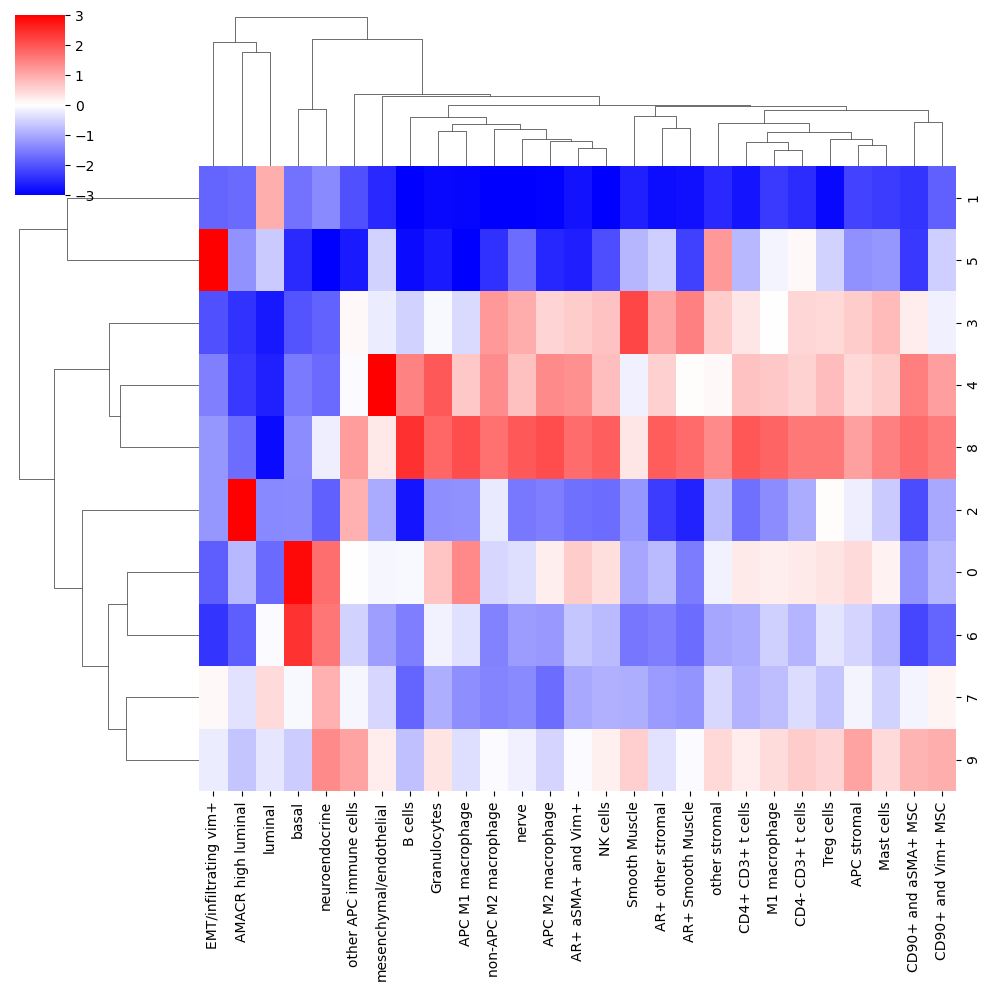

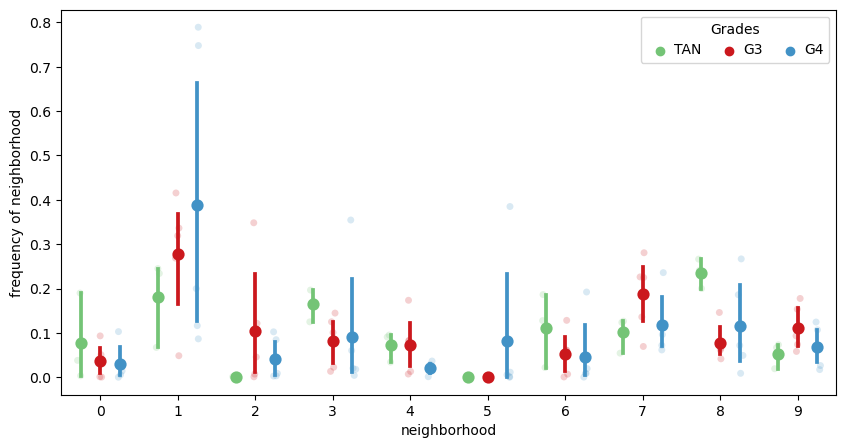

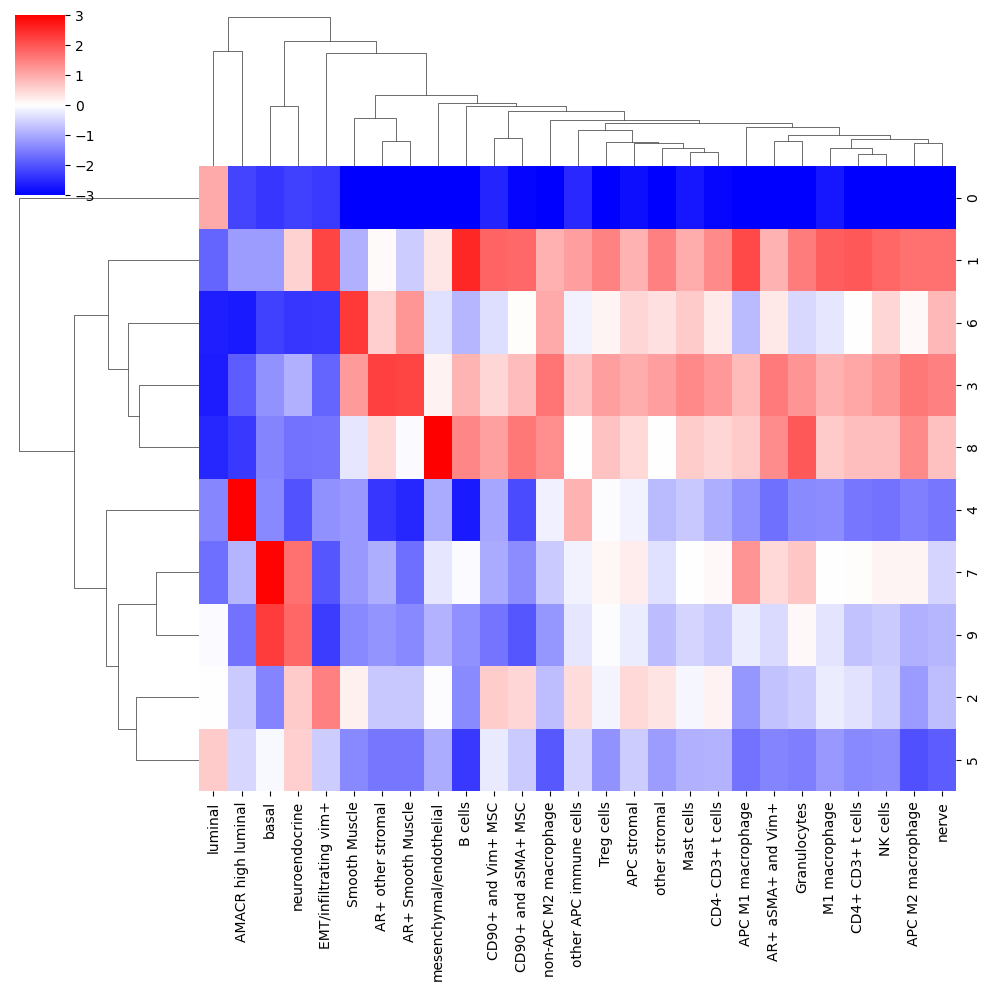

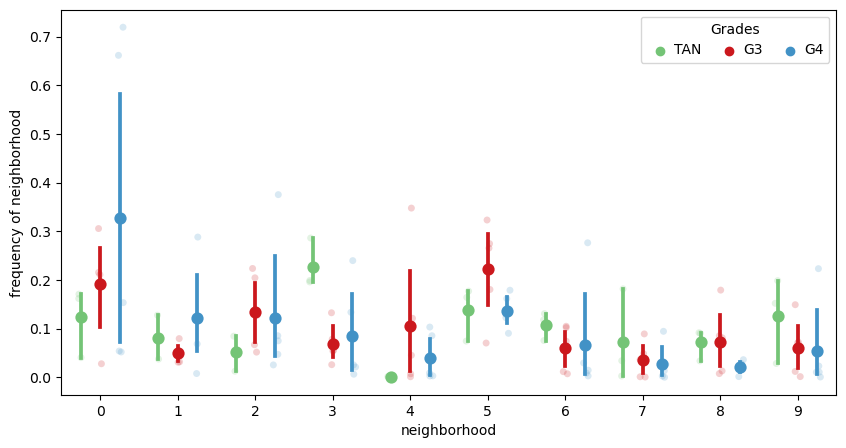

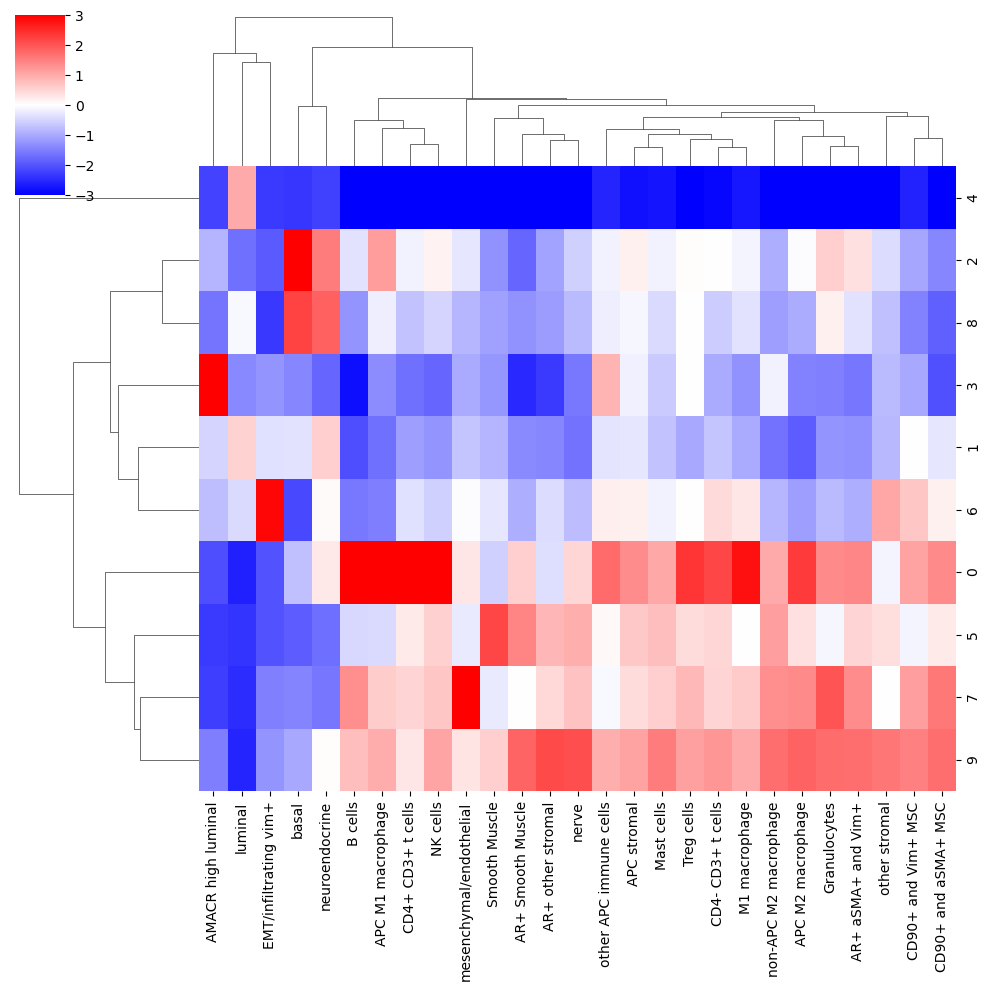

...

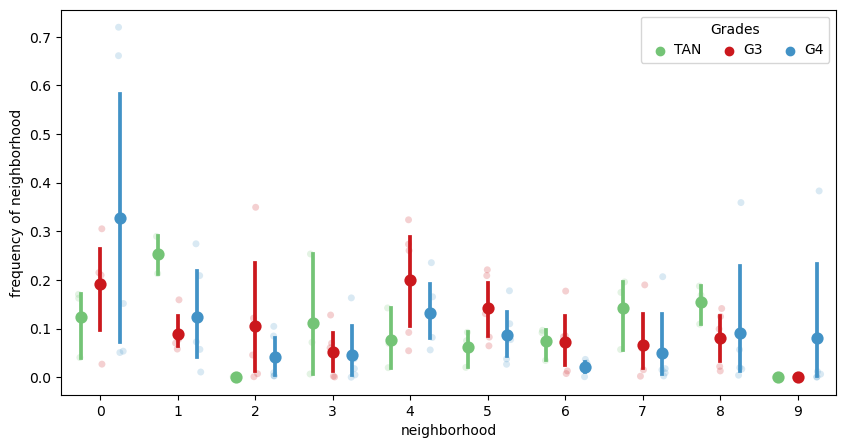

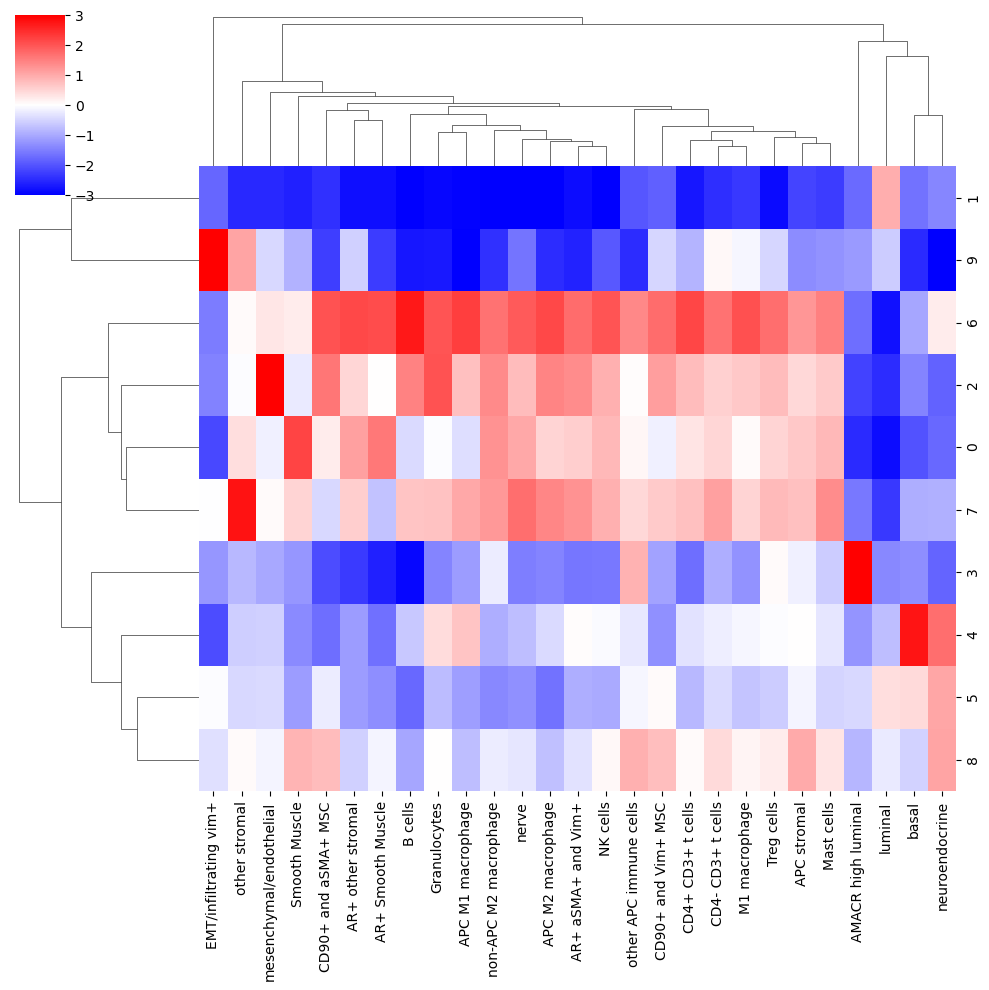

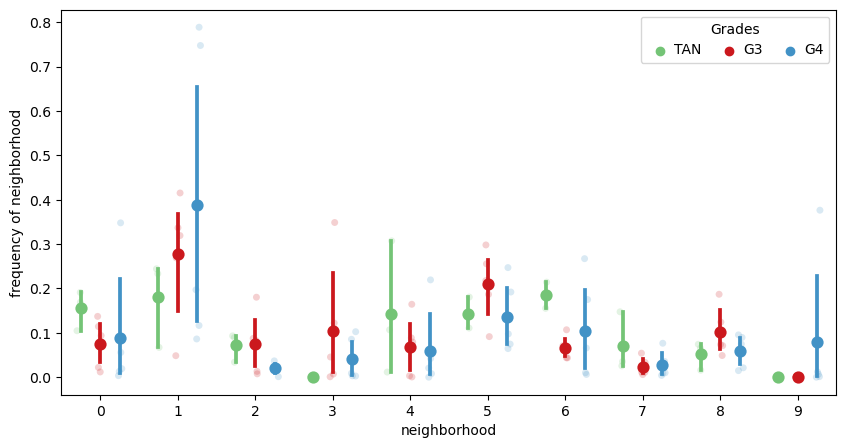

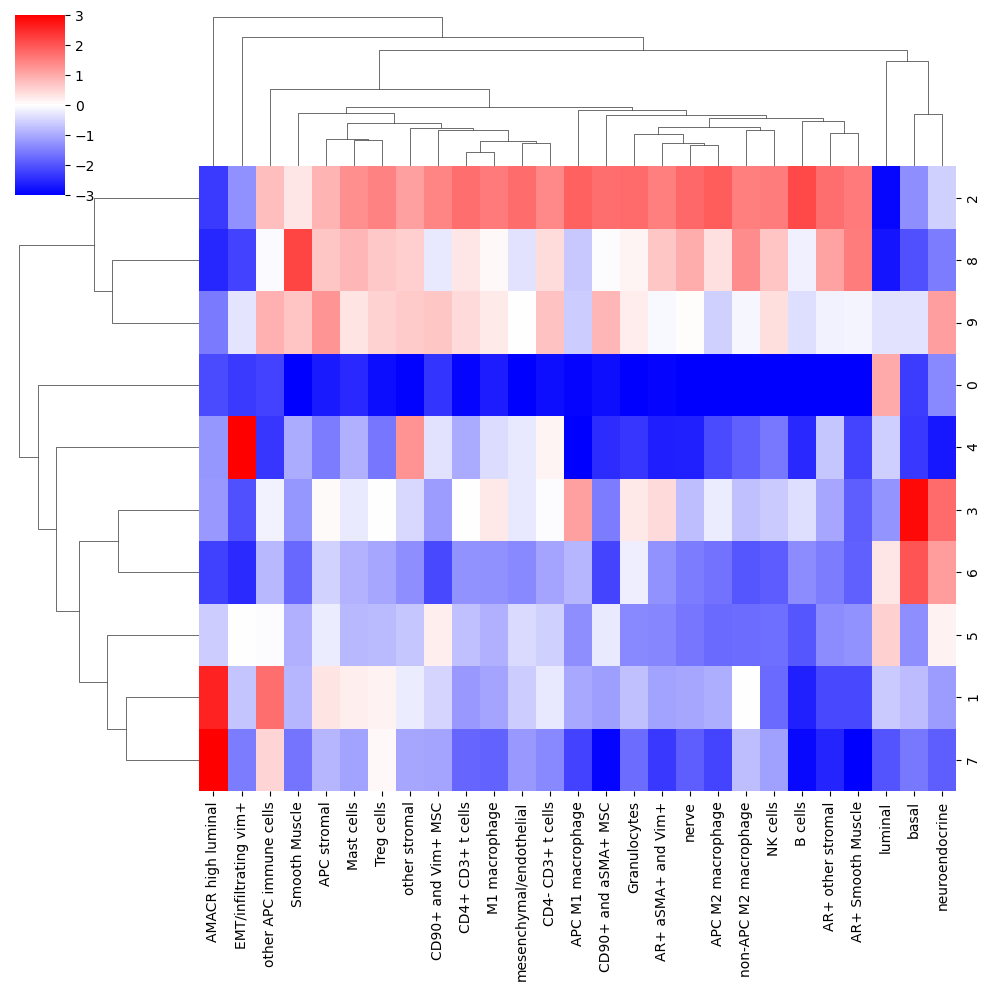

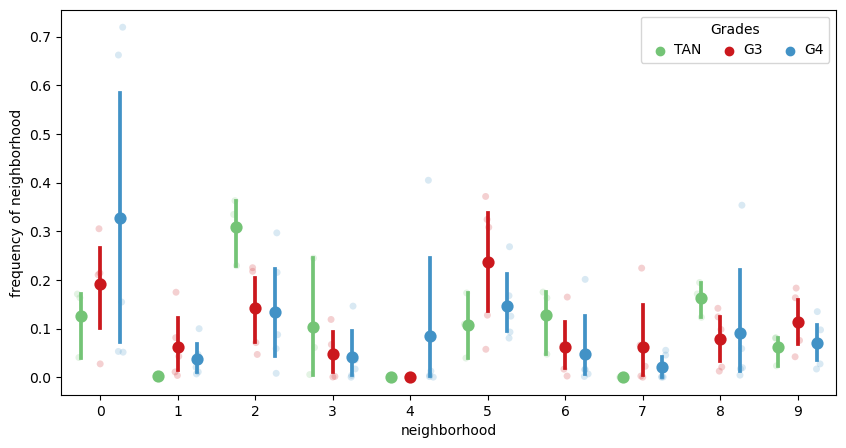

In [4]:
import random

for replication in range(100):
    
    random.seed(replication)
    ############
    #read in data and do some quick data rearrangement
    if file_type == 'pickle':
        cells = pd.read_pickle(path_to_data)
    if file_type == 'csv':
    #CA read data to be combined
        cells1 = pd.read_csv('G3-PCa_dfmerged_Nolan-names_0904.csv')
        cells1_99 = cells1.sample(frac=0.99)
        cells2 = pd.read_csv('G4-PCa_dfmerged_Nolan-names_0904.csv')
        cells2_99 = cells2.sample(frac=0.99)
        cells3 = pd.read_csv('TAN-PCa_dfmerged_Nolan-names_0904.csv')
        cells3_99 = cells3.sample(frac=0.99)
    
    #CA combine all data read with the next to line
    cells_3groups = [cells1_99, cells2_99, cells3_99]
    cells_all = pd.concat(cells_3groups)

    cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)

    cells = cells.reset_index() #Uncomment this line if you do any subsetting of dataframe such as removing dirt etc or will throw error at end of next next code block (cell 6)

    sum_cols = cells[cluster_col].unique()
    values = cells[sum_cols].values
    #############
    #find windows for each cell in each tissue region
    tissue_group = cells[[X,Y,reg]].groupby(reg)
    exps = list(cells[reg].unique())
    tissue_chunks = [(time.time(),exps.index(t),t,a) for t,indices in tissue_group.groups.items() for a in np.array_split(indices,1)] 
    tissues = [get_windows(job,n_neighbors) for job in tissue_chunks]
    #for each cell and its nearest neighbors, reshape and count the number of each cell type in those neighbors.
    out_dict = {}
    for k in ks:
        for neighbors,job in zip(tissues,tissue_chunks):

            chunk = np.arange(len(neighbors))#indices
            tissue_name = job[2]
            indices = job[3]
            window = values[neighbors[chunk,:k].flatten()].reshape(len(chunk),k,len(sum_cols)).sum(axis = 1)
            out_dict[(tissue_name,k)] = (window.astype(np.float16),indices)

    #concatenate the summed windows and combine into one dataframe for each window size tested.
    windows = {}
    for k in ks:
   
        window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
        window = window.loc[cells.index.values]
        window = pd.concat([cells[keep_cols],window],1)
        windows[k] = window
    k = 10
    n_neighborhoods = 10
    neighborhood_name = "neighborhood"+str(k)
    k_centroids = {}
    windows2 = windows[10]
    # windows2[cluster_col] = cells[cluster_col]

    km = MiniBatchKMeans(n_clusters = n_neighborhoods,random_state=0)

    labelskm = km.fit_predict(windows2[sum_cols].values)
    k_centroids[k] = km.cluster_centers_
    cells['neighborhood10'] = labelskm
    cells[neighborhood_name] = cells[neighborhood_name].astype('category')
    #['reg064_A','reg066_A','reg018_B','reg023_A']
    # this plot shows the types of cells (ClusterIDs) in the different niches 
    k_to_plot = 10
    niche_clusters = (k_centroids[k_to_plot])
    tissue_avgs = values.mean(axis = 0)
    fc = np.log2(((niche_clusters+tissue_avgs)/(niche_clusters+tissue_avgs).sum(axis = 1, keepdims = True))/tissue_avgs)
    fc = pd.DataFrame(fc,columns = sum_cols)
    #s=sns.clustermap(fc.loc[[0,2,3,4,5,6,7,8,9],cell_order], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = False)
    s=sns.clustermap(fc.loc[[0,1,2,3,4,5,6,7,8,9],], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = True)
    #s.savefig("random99_ar_cn/celltypes_perniche_10_replication{}.pdf".format(replication))
    ar_cn=np.unique(np.concatenate((np.where(fc['AR+ aSMA+ and Vim+'] > 0),
               np.where(fc['AR+ Smooth Muscle'] > 0), 
               np.where(fc['AR+ other stromal'] > 0)), axis = None))
    #plot for each group and each patient the percent of total cells allocated to each neighborhood
    fc = cells.groupby(['patients','groups']).apply(lambda x: x['neighborhood10'].value_counts(sort = False,normalize = True))

    fc.columns = range(10)
    melt = pd.melt(fc.reset_index(),id_vars = ['patients','groups'])
    melt = melt.rename(columns = {'variable':'neighborhood','value':'frequency of neighborhood'})
    f,ax = plt.subplots(figsize = (10,5))
    sns.stripplot(data = melt, hue = 'groups',dodge = True,alpha = .2,x ='neighborhood', y ='frequency of neighborhood', palette=["#74c476", "#cb181d", "#4292c6"])
    sns.pointplot(data = melt, hue = 'groups',dodge = .5,join = False,x ='neighborhood', y ='frequency of neighborhood', palette=["#74c476", "#cb181d", "#4292c6"])

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:3], ['TAN', 'G3', 'G4'], title="Grades", #CA changed labels[:3] to ['TAN', 'G3', 'G4']
          handletextpad=0, columnspacing=1,
          loc="upper right", ncol=3, frameon=True)
    #plt.savefig('random99_ar_cn/neighborhood_comparison_by_grade_replication{}.pdf'.format(replication))
    
    from scipy.stats import ttest_ind
    #t-test to evaluate if any neighborhood is enriched in one group TAN vs G3
    ttest_tan_g3 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_tan_g3.append(ttest_ind(n2[n2['groups']==0]['frequency of neighborhood'],n2[n2['groups']==3]['frequency of neighborhood']))
    ttest_tan_g3 = pd.DataFrame(ttest_tan_g3)
    ttest_tan_g3.to_csv('random99_ar_cn/random/ttest_tan_g3_replication{}.csv'.format(replication), index=False)
    ttest_tan_g3 = ttest_tan_g3.loc[ar_cn,:]
    ttest_tan_g3.to_csv('random99_ar_cn/ar/ttest_tan_g3_replication{}.csv'.format(replication), index=False)
    
    #t-test to evaluate if any neighborhood is enriched in one group TAN vs G4
    ttest_tan_g4 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_tan_g4.append(ttest_ind(n2[n2['groups']==0]['frequency of neighborhood'],n2[n2['groups']==4]['frequency of neighborhood']))
    ttest_tan_g4 = pd.DataFrame(ttest_tan_g4)
    ttest_tan_g4.to_csv('random99_ar_cn/random/ttest_tan_g4_replication{}.csv'.format(replication), index=False)
    ttest_tan_g3= ttest_tan_g3.loc[ar_cn,:]
    ttest_tan_g4.to_csv('random99_ar_cn/ar/ttest_tan_g4_replication{}.csv'.format(replication), index=False)
    
    #t-test to evaluate if any neighborhood is enriched in one group G3 vs G4
    ttest_g3_g4 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_g3_g4.append(ttest_ind(n2[n2['groups']==3]['frequency of neighborhood'],n2[n2['groups']==4]['frequency of neighborhood']))
    ttest_g3_g4 = pd.DataFrame(ttest_g3_g4)
    ttest_g3_g4.to_csv('random99_ar_cn/random/ttest_g3_g4_replication{}.csv'.format(replication), index=False)
    ttest_g3_g4 = ttest_g3_g4.loc[ar_cn,:]
    ttest_g3_g4.to_csv('random99_ar_cn/ar/ttest_g3_g4_replication{}.csv'.format(replication), index=False)